In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.transforms as transforms
from shapely import Point, MultiPoint, LineString, MultiLineString
from shapely.ops import linemerge
from pyproj import Geod
import contextily as ctx
from matplotlib.lines import Line2D

pct = gpd.read_file("data/full_PCT_NoBo.gpkg")
cdt = gpd.read_file("data/full_CDT_NoBo.gpkg")
at = gpd.read_file("data/full_AT_NoBo.gpkg")

borders = gpd.read_file("data/ne_10m_admin_1_states_provinces/ne_10m_admin_1_states_provinces.shp")

# Grab north american continent except only contiguous states
northam = borders[borders["adm0_a3"].isin(["USA", "CAN", "MEX"])]
northam = northam[~northam["name"].isin(["Hawaii","Alaska",])]

In [3]:
class TrailAnalyzer:
    def __init__(self, trail_gdf):
        self.trail = trail_gdf
        self.geod = Geod(ellps="WGS84")
        self._precompute_geodesic_segments()

    def _precompute_geodesic_segments(self):
        """Precompute the geodesic segments along the trail for efficiency."""
        line = self.trail.geometry.iloc[0]
        self.lons, self.lats = line.xy
        self.az12, self.az21, self.segment_lengths = self.geod.inv(
            self.lons[:-1], self.lats[:-1], self.lons[1:], self.lats[1:]
        )
        self.cumulative_lengths = np.insert(np.cumsum(self.segment_lengths), 0, 0)
        self.total_length_meters = self.cumulative_lengths[-1]

    def geodesic_point(self, fraction_along):
        """Returns the geodesically accurate point at a fraction along the trail."""
        target_dist = fraction_along * self.total_length_meters
        i = np.searchsorted(self.cumulative_lengths, target_dist, side="right")
        i = min(max(i, 1), len(self.az12))

        seg_dist = target_dist - self.cumulative_lengths[i - 1]
        lon1, lat1 = self.lons[i - 1], self.lats[i - 1]
        azimuth = self.az12[i - 1]

        lon, lat, _ = self.geod.fwd(lon1, lat1, azimuth, seg_dist)
        return Point(lon, lat)

    def projected_point(self, fraction_along, proj_crs):
        """Returns the point obtained by interpolating along a projected version of the trail."""
        trail_proj = self.trail.to_crs(proj_crs)
        projected_line = trail_proj.geometry.iloc[0]
        projected_point = projected_line.interpolate(
            projected_line.length * fraction_along
        )
        point_back_in_wgs84 = gpd.GeoDataFrame(
            geometry=[projected_point], crs=proj_crs
        ).to_crs(self.trail.crs)
        return point_back_in_wgs84.geometry.iloc[0]

    def positional_error(self, fraction_along, proj_crs):
        """
        Returns the true geodesic distance between projected vs true location (in miles),
        with sign based on whether you're ahead or behind schedule on the map projection.
        """
        true_point = self.geodesic_point(fraction_along)
        proj_point = self.projected_point(fraction_along, proj_crs)
        dist_miles = (
            self.geod.inv(true_point.x, true_point.y, proj_point.x, proj_point.y)[2]
            / 1609.344
        )

        # Find the distance along the original trail for this point
        original_line = self.trail.geometry.iloc[0]
        fraction_along_original = (
            original_line.project(proj_point) / original_line.length
        )
        sign = -1 if fraction_along_original > fraction_along else 1

        return dist_miles * sign

    def error_profile(self, proj_crs, num_samples=100):
        """Samples points along the trail and returns list of distances (in miles) between true and projected."""
        return [
            self.positional_error(fraction, proj_crs)
            for fraction in np.linspace(0, 1, num_samples + 1)
        ]

    def mean_error_between(self, f_start, f_end, proj_crs, num_samples=20):
        """Returns mean positional error (in miles) between two fractions of trail"""
        fractions = np.linspace(f_start, f_end, num_samples)
        errors = [self.positional_error(f, proj_crs) for f in fractions]
        return np.mean(errors)


def mean_azimuth(gdf):
    if gdf.crs == "EPSG:4326":
        trail = gdf.copy()
    else:
        trail = gdf.to_crs("EPSG:4326").copy()
    idx = len(trail) - 1
    x1 = trail.geometry[0].coords[0]
    x2 = trail.geometry[idx].coords[-1]
    dx, dy = np.array(x2) - np.array(x1)
    return np.degrees(np.arctan2(dy, dx)) + 180


def get_bounds(p1, p2, xb, yb):
    # Create a MultiPoint object and get the envelope (bounding box)
    poly = MultiPoint([p1, p2]).envelope
    xmin, ymin, xmax, ymax = poly.bounds

    # Get the width (dx) and height (dy) of the bounding box
    dx = xmax - xmin
    dy = ymax - ymin

    # Apply the buffer scale to the bounding box size
    xlim = [xmin - xb * dx, xmax + xb * dx]
    ylim = [ymin - yb * dy, ymax + yb * dy]

    return xlim, ylim

I hiked the Appalachian Trail in 2023. Tomorrow is the two-year anniversary of my start date, and it's got me reminiscing hard. I've been looking back at old photos, thinking about good times with friends, hard times with ascents, and gentle times with my knees. On my hike, (#LongestWettestHottest), I experieneced just about all of the cliches you can expect from the trail, and I wanted to put one of those to the test today: the Virginia Blues.

Objectively, Virginia is a long state. Of the 13 states the Trail crosses, Virginia covers about a quater of the entire thing. And it's a psychologically challenging stretch of trail for a lot of hikers. After the early excitement of jumping into the unknown, we quickly crossed one, two, three states! And then spend over a month traipsing through Virginia up yet another roller coaster. I adored Trail Days, the Triple Crown, the blackberry milkshakes (iykyk), and Grayson Highlands, but man did it start to slog on.

<img src="src/greenland_size.gif" width="300" style="float: left; margin-right: 15px; margin-bottom: 10px;">
I'm writing today to share good news: the maps have been lying to us. Virginia is long, but not as long as it looks on your phone. Fundamentally, every map you've ever seen is a lie. When expressing our round planet on a flat surface, there are certain non-negotiable compromises: you can either preserve the **shape** of map features, or you can preserve the **size**. And the universal standard for digital mapping applications, Web Mercator, it distorts size. This can be seen in pretty dramatic fashion when we use [TheTrueSizeOf](https://thetruesize.com/), a website which allows you to move countries around and preserves their true size. 




So things aren't as dramatic when we move from Georgia to Maine, but there's still some distortion. The question is: how much? And can I blame my struggling morale on this map? 
<div style="clear: both;"></div>

<img src="src/simple-cylindrical-projection-earth-map-globe-mercator.jpg" width="500" style="float: left; margin-right: 15px; margin-bottom: 10px"/>


The key metric I investigate is the relationship between your true progress on the trail, simply how many miles you've hiked expressed as a percentage of the total length, and your map-based progress: how far does it look like you've hiked when you eyeball it by looking at the map. 

Before we look at complicated trails like the AT which has switchback-after-switchback, zig-zag-a-plenty, and moves as far east as it does north, how about I propose a new long-distance trail: I call it the Coast to Coast Trail, and I think it's going to be a real big hit with the hiking community. The Coast to Coast trail starts in the Arctic Circle, on the shores of mainland Nunavut. At only 60 miles away from Cambridge Bay, a small town which hosts a group of Canadian Arctic Researchers, it's an incredibly accessible trail start! The Coast to Coast Trail travels due south, through occasional lakes and ponds, forgoing any switchbacks. It crosses down through the Northwest Territories, through Saskatchewan, and into the United States in eastern Montana! It continues its path without a single turn, heading due south, just westof the Black Hills, straight onto downtown Denver. After a few more states and a quick swim across the Rio Grande, it's south through the Chihuahuan Desert, scaling cliffs in the Copper Canyons (remember: no turns), until eventually after nearly 3500 miles, you reach a beautiful beach in Jalisco, MX, overlooking the Pacific Ocean. Nice right? [shorten this a TON]

<img src="src/coast2coast_map.png" style="middle" width="300"/>

If you were approaching this trail SoBo as I've suggested, you might be overjoyed to find your year-long grind on the world's worst planned trail is entering its second half. But as much as you love my trail, you decided it isn't for you. You want to get to that halfway point and call it a win. You pulled out a ruler and estimated the halfway point on your map (red triangle above). To really go for it, you decide you might as well hike all the way to the Canada/USA Border. But then I send you a text from my cozy home in Vermont. I figured it'd be nice for you to have access to the trail centerline in Google Earth, just in case you get lost. 

![Coast to Coast Globe](src/coast2coast_globe.png)

Uh oh. Looking at the globe, you're not so sure. Eyeballing it, you reckon you're barely more than a third done with this nightmare. And you'd be right. The true halfway point is in Wyoming, just west of the Black Hills of South Dakota. You've got nearly 400 more miles to go. Another month on the trail. Isn't that a shame? The map lied to you. 

[I think the above few paragraphs on the Coast to Coast route should be NoBo instead so that the reader understands the emotional impact. They've hiked from Mexico to Wyoming and can't believe they're only about a third done with the trail. It starts to weigh on them just like the Virginia Blues. The MAP is demoralizing them, even though they're actually nearly halfway done!]

Okay, the Coast to Coast Trail isn't very well thought out, but it does illustrate a point. Of course the mile markers don't lie to us, but we're visual creatures, we want to see ourselves making progress. And the Coast to Coast Trail is pretty stark in this contrast, 400 miles is a huge deficit. But what about real trails? Trails at lower latitudes that twist and turn?

Well, it turns out the difference isn't as large, but it's enough to have an impact. 

In [4]:
# Web Mercator
proj_crs = "EPSG:3857"

In [5]:
trail_analyzer = TrailAnalyzer(cdt)
cdt_err = trail_analyzer.error_profile(proj_crs)

In [6]:
trail_analyzer = TrailAnalyzer(pct)
pct_err = trail_analyzer.error_profile(proj_crs)

In [7]:
trail_analyzer = TrailAnalyzer(at)
at_err = trail_analyzer.error_profile(proj_crs)

In [8]:
# north/south trail
coords = LineString([[-100, 17], [-100, 67.8]])
coords = LineString([[-105, 19.3], [-105, 68.3]])
vert_trail = gpd.GeoDataFrame(geometry=[coords], crs="EPSG:4326")

trail_analyzer = TrailAnalyzer(vert_trail)
vert_err = trail_analyzer.error_profile(proj_crs)

# How Map Distortion Impacts Perceived Progress on Thru Hikes

I'm Hot Feet, AT Class of 2023. I recently celebrated the two-year anniversary of my start date, and it’s got me reminiscing hard. I’ve been looking back at old photos, thinking about the good times with friends, the hard times with ascents, and the gentler times with my knees.

On my hike, I experienced just about all the clichés the trail has to offer, and one in particular has been on my mind: the Virginia Blues. Objectively, Virginia is long. Of the 13 states the AT crosses, Virginia covers about a quarter of the entire trail. It’s a psychologically challenging stretch for a lot of hikers. After the early rush of adventure—crossing through Georgia, North Carolina, and Tennessee—we hit Virginia and... stayed there. 

For over a month. Just Virginia. 

During this long slough, I began to wonder: why did it feel like we were making so little progress? Yes, there are mile markers. But sometimes I could swear I'd pass three of the 100 mile markers in a week, and other times it'd take me a month to pass one. A huge part of perceived progress is psychological. And there are a ton of different factors that influence that. With a background in earth science and a passable knowledge of mapping projections, I wanted to perform a rigorous analysis determining how much the maps could be misleading us hikers. And as it turns out, it's significant.

---

## Maps: an Imperfect Representation

<img src="src/trail/simple-cylindrical-projection-earth-map-globe-mercator.jpg" width="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">

Before we get into the specifics, we require a quick primer on maps. The Earth is a 3D nearly-spherical planet, and maps of it are 2D and generally rectangular. When transforming geographic features from a globe to a sheet, compromises have to be made. Every map has to make a compromise between preserving features shape or their size and there are different mathematical transformations, called map projections, that preserve relevant features for specific use-cases. For essentially all online and digital mapping, the standard is Web Mercator, which preserves shape and distorts size, impacting the distance between features substantially. 

This sketch conceptually demonstrates how the Mercator projection is created, first wrap your blank map into a cylinder around the globe. Then imagine a light source at the center of the Earth projecting the "shadows" of the continents onto the cylinder, which is then unfurled to give our final map. Features near the equator aren't warped much, since the cylinder is very close to the globe, but in polar regions like Russia or Antarctica, the distance between the two allows the "shadow" to become very distorted, changing the shape.

<div style="clear: both;"></div>

<img src="src/trail/greenland_size.gif" width="300" style="float: left; margin-right: 15px; margin-bottom: 10px;">


The classic example is the apparent vastness of Greenland. [TheTrueSize.com](https://thetruesize.com) is a great tool that allows you to interrogate the distortions from the Mercator projection on a global scale. I've used it to record this animation. Since accurate navigation hinges on accurate directions, Mercator has historically been used for seafaring applications, and is still the standard for both car navigation apps like Google Maps and hiking apps like AllTrails and FarOut. Mercator preserves directionality on a local scale: anywhere in the world, if two roads meet at a right angle, Mercator will show it as a right angle. 

Typically, distortions in size associated with the Mercator projection are at a much larger scale than people are working with. We either use alternative maps for navigation, like great circles on globes for airline travel, or we don't notice the impact because the journey isn't much work, like in a cross country road trip. Long distance hiking exists at the overlap in that venn diagram: the journey is on a large enough scale that map distortions have an impact **and** hikers travel slow enough that they feel it. 

<div style="clear: both;"></div>


---



## Enter: The Coast to Coast Trail

<img src="src/trail/coast2coast_map_both.png" width="300" style="float: left; margin-right: 15px; margin-bottom: 10px;">

To explore this effect, I invented a trail. An awful one.

The Coast to Coast Trail starts on a beach in Jalisco, Mexico and goes due north—no switchbacks, no scenic detours—just a straight shot to Nunavut, Canada. Nearly 3,500 miles marching due north. See a bridge half a mile west? Don't care, you're swimming. Coming up to a cliff? Hope you brought your climbing gear. 

Imagine I've given you my painstakingly created map and you're attempting the world's first completion of the Coast to Coast Trail, hiking northbound. You've made it to Colorado and take a well deserved zero in Denver. You've spent a few months on this trail and have realized I'm awful at designing trails. Rather than spend the rest of the year completing it, you want to leave your mark--a big sign at the halfway point--and then come home to scold me for sending you on that journey. So you pull up your map, grab a ruler, and measure out the halfway point. You're devastated. It's over 600 miles away across the border, in southern Saskatchewan. It's been months and you're barely a third of the way done.

Weeks pass. Your legs ache. Resentment for the Coast To Coast Trail grows. You make it to a little town in southern Montana and pull into a motel. You spot a dusty old globe sitting in the lobby and trace the trail on the globe and realize it--you're already way past the halfway point. It was in Wyoming! You pack up your bags and go home. 

On this map, the red triangle represents the apparent halfway point based on the map's appearance and the yellow circle represents the real halfway point. The difference between the two is nearly 400 miles. The psychological interpretation of that is clear: if you're going off the map, you'll feel like you're lagging behind. For the Coast to Coast Trail, you'll feel like you're about a month behind where you think you should be. Your sense of progress can take a massive hit.

<div style="clear: both;"></div> 

---

## On The Appalachian Trail

The Coast to Coast Trail is designed to maximize this effect, spanning 20 degrees in latitude. The Appalachian Trail isn't quite as extreme, but the same distortion shows up. When you're deep in Virginia—pushing big miles and crossing endless ridgelines—it can feel like you're going nowhere. The map isn't showing your progress the way your body feels it. Luckily, we have plenty of symbolic markers to strive for, not just points on a map. 

Getting out of Virginia and making it to Harper's Ferry is the unofficial halfway point. Getting that photo at the ATC feels monumental. But the actual halfway point? It’s still 70 trail miles north in Pennsylvania. 70 miles isn't much, but due to map distortion, it looks like even more. The real halfway point appears nearly 110 miles away from Harpers Ferry on a digital map. That’s an extra 40 miles of perceived distance—not in your legs, but in your brain. Another few days of “not quite there yet,” even when you are.

I calculated these predictions by writing [some Python code (source)](here.com) to compute the distance along the trail in real distance and in projected distance for a given map projection. While it's pretty easy to understand for the Coast to Coast Trail, the complex paths of real trails snaking around make the results a little less intuitive. 

<img src="src/trail/at_map.png" height="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<img src="src/trail/at_sat.png" height="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<div style="clear: both;"></div> 

<img src="src/trail/blue_ridge.png" height="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">

The difference between the two is about 40 miles, an order of magnitude less than on the Coast to Coast Trail. And in the context of the entire AT, that isn't extreme. But looking at the satellite imagery, it isn't nothing. The true halfway point and the apparent halfway point are in entirely different mountain ranges! If you've hiked this section of PA, you may remember seeing a plaque just before you descend into Boiling Springs, PA. 

This plaque marks the northernmost extent of the Blue Ridge Mountains. From that point, you want down into the Cumberland Valley and then up into the Allegheny Mountains where the apparent halfway point is. 40 miles may not seem like much, but when you eyeball your progress on a map, you may be off by an entire mountain range!

<div style="clear: both;"></div> 

---

## Northbound vs. Southbound

But here’s where it gets interesting. I've chosen the halfway point as a single reference to measure the map distortion, but there's always some error in your position unless you're at one of the ends, since there's absolutely zero confusion about where you are on the trail. Intuitively, it makes sense that we accumulate error as we walk and eventually have to make it up somewhere. It turns out that north of the halfway point, map distortion works in the opposite direction. As you head further north, the map starts to compress those miles, and you’ll actually cover ground faster than it appears. This makes sense looking at the halfway point on the Coast to Coast Trail: it looks like there's a good 60% of the trail left, but it's actually only 50%. 

So while you may have felt like you were lagging behind in Virginia, the map now starts showing you more progress. For NoBo hikers, the perception of progress catches up with your actual progress, it feels like you're hiking a little bit further every day than you are.

But for SoBo hikers, the opposite happens. The map actually overestimates your progress for the first half. You're still getting your trail legs but the map is working with you. In the second half of the trail, you're probably crushing marathon days but the map is underestimating your progress, making those 150 mile weeks look more like 140. 

---

## Triple Crown Comparison

Here’s how the distortion looks on the other two Triple Crown trails:

**Pacific Crest Trail:**

<img src="src/trail/pct_map.png" height="600" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<img src="src/trail/pct_sat.png" height="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<div style="clear: both;"></div> 

On the PCT, the true halfway point is just to the west of Lake Almanor. The apparent halfway point is over 50 miles ahead, between Mt. Shasta and Mt. Lassen. 

**Continental Divide Trail:**

<img src="src/trail/cdt_map.png" height="600" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<img src="src/trail/cdt_sat.png" height="400" style="float: left; margin-right: 15px; margin-bottom: 10px;">


<div style="clear: both;"></div> 

---

## So What’s the Real Difference?

All of the real trails have a discrepancy on the order of at least a few days hike. While this isn't extreme, it is consistent and systematic and visible even in the context of the entire United States. For longer thru-hikes that span greater latitudes like the Great Divide Trail and International Appalachian Trail, the discrepancies grow proportionally. 

Still, it matters.

- On the AT, the halfway point is off by about 35 miles.
- On the PCT, it’s 55.
- On the CDT? About 40 miles.

Thru-hiking is built on milestones. We count every mile. We celebrate round numbers. We plan resupplies, zeroes, and big pushes around our mental maps. When that map quietly distorts your progress, it chips away at morale. And these distortions exist in most digital maps of the trail. 

And when you're deep in the long green tunnel of Virginia—or the dusty switchbacks of Northern California, or the endless ridges of Colorado—that small psychological edge might be the thing that keeps you moving. Or doesn’t.

A 40-mile gap on a 2,200-mile hike isn’t going to strand you in the woods—but it can quietly mess with your head. When your GPS dot barely budges across Virginia ridges, even a small visual lag can chip away at your morale. After all, the AT is as much a journey of the mind as it is of the body. A small tweak in how you read a map can be the difference between feeling stuck and remembering that every step is real progress—no matter what the screen says.
Happy trails—and may your miles always feel just a little closer than they look.


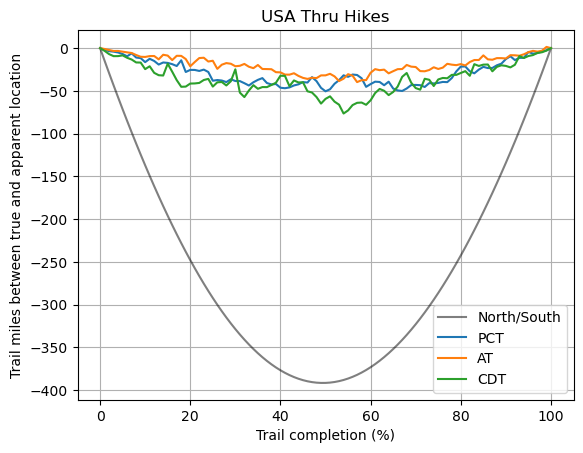

In [9]:
xs = range(0, 101)
plt.plot(xs, np.array(vert_err), label="North/South", color="black", alpha=0.5)
plt.plot(xs, np.array(pct_err), label="PCT")
plt.plot(xs, np.array(at_err), label="AT")
plt.plot(xs, np.array(cdt_err), label="CDT")
plt.legend()
plt.xlabel("Trail completion (%)")
plt.ylabel("Trail miles between true and apparent location")
plt.grid("minor")
plt.title("USA Thru Hikes")
plt.show()

In [10]:
# Precompute midpoint and mean error for each trail
trail_stats = []
names = ['Pacific Crest Trail', 'Continental Divide Trail', 'Appalachian Trail', 'Vertical Trail']
for i, trail in enumerate((pct, cdt, at, vert_trail)):
    analyzer = TrailAnalyzer(trail)
    midpoint = analyzer.geodesic_point(0.5)
    projected = analyzer.projected_point(0.5, 'EPSG:3857')
    mean_err = analyzer.mean_error_between(0.4, 0.6, "EPSG:3857")
    name = names[i]
    trail_stats.append((name, trail, midpoint, projected, np.abs(mean_err)))

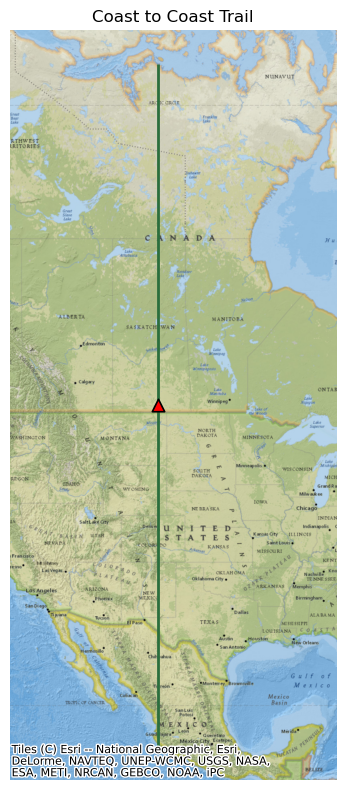

In [11]:
import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 8))

name, trail, midpoint, projected, mean_err = trail_stats[3]

trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="#2b6e3d", linewidth=2, linestyle="-")
#ax.scatter(midpoint_3857.x, midpoint_3857.y, s=80, marker='o', facecolor='gold', edgecolor='black', linewidth=1.2, zorder=10)
ax.scatter(projected_3857.x, projected_3857.y, s=80, marker='^', facecolor='red', edgecolor='black', linewidth=1.2, zorder=10)
#ax.text(midpoint_3857.x, midpoint_3857.y, f"  {mean_err:.1f} mi", fontsize=10, ha="left", va="bottom")

ax.set_xlim((-1.35e7, -0.95e7))
ctx.add_basemap(ax, source=ctx.providers.Esri.NatGeoWorldMap, zoom=5)
ax.set_axis_off()
plt.title('Coast to Coast Trail')
plt.tight_layout()
plt.show()

In [12]:
list(ctx.providers)

['OpenStreetMap',
 'MapTilesAPI',
 'OpenSeaMap',
 'OPNVKarte',
 'OpenTopoMap',
 'OpenRailwayMap',
 'OpenFireMap',
 'SafeCast',
 'Stadia',
 'Thunderforest',
 'BaseMapDE',
 'CyclOSM',
 'Jawg',
 'MapBox',
 'MapTiler',
 'TomTom',
 'Esri',
 'OpenWeatherMap',
 'HERE',
 'HEREv3',
 'FreeMapSK',
 'MtbMap',
 'CartoDB',
 'HikeBike',
 'BasemapAT',
 'nlmaps',
 'NASAGIBS',
 'NLS',
 'JusticeMap',
 'GeoportailFrance',
 'OneMapSG',
 'USGS',
 'WaymarkedTrails',
 'OpenAIP',
 'OpenSnowMap',
 'AzureMaps',
 'SwissFederalGeoportal',
 'TopPlusOpen',
 'Gaode',
 'Strava',
 'OrdnanceSurvey']

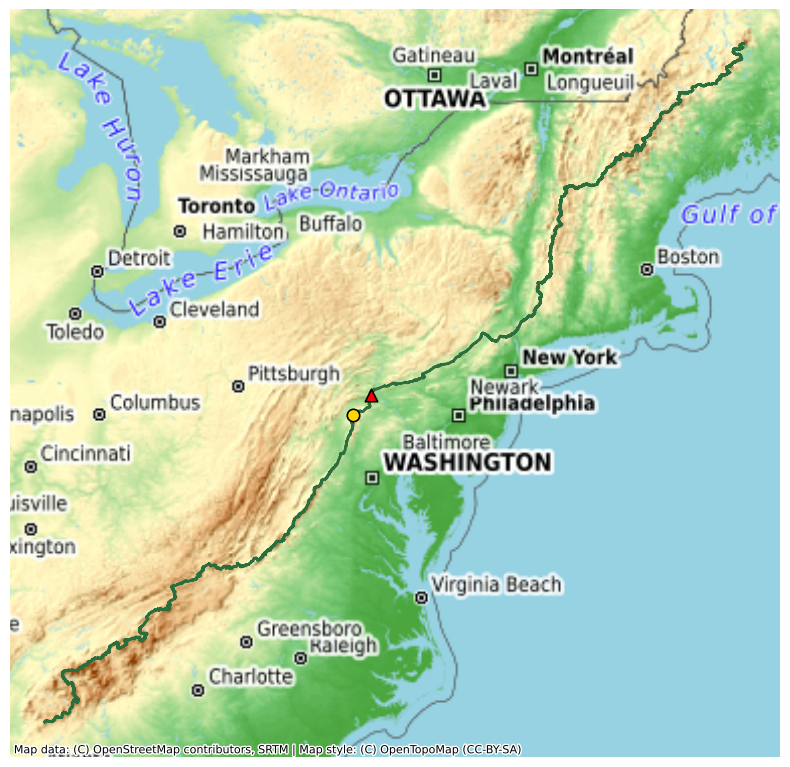

Appalachian Trail, distance between: 33.3 mi


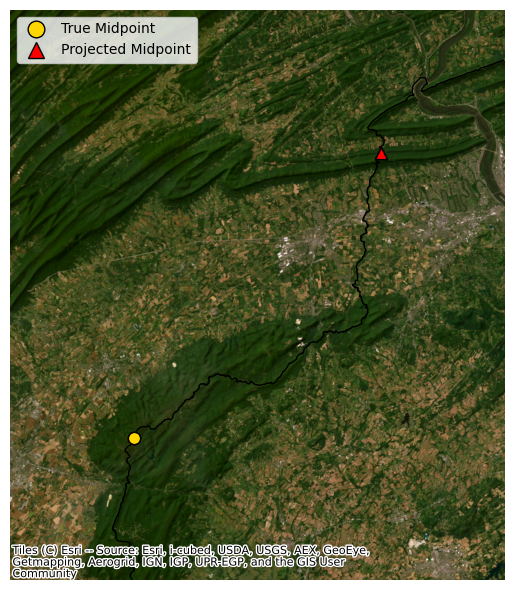

In [ ]:

fig, ax = plt.subplots(figsize=(8, 8))

name, trail, midpoint, projected, mean_err = trail_stats[2]

trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="#2b6e3d", linewidth=2, linestyle="-")
ax.scatter(
    midpoint_3857.x,
    midpoint_3857.y,
    s=80,
    marker="o",
    facecolor="gold",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)
ax.scatter(
    projected_3857.x,
    projected_3857.y,
    s=80,
    marker="^",
    facecolor="red",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)

# ax.set_xlim((-1.35e7, -0.95e7))
ctx.add_basemap(ax, source=ctx.providers.OpenTopoMap, zoom=5)
ax.set_axis_off()
# plt.title("Appalachian Trail")
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(6, 6))

name, trail, midpoint, projected, mean_err =trail_stats[2]
trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="k", linewidth=1, linestyle="-")
ax.scatter(midpoint_3857.x, midpoint_3857.y, 
       s=80, marker='o', facecolor='gold', edgecolor='black', linewidth=1.2, zorder=10)
ax.scatter(projected_3857.x, projected_3857.y,
       s=80, marker='^', facecolor='red', edgecolor='black', linewidth=1.2, zorder=10)
# ax.text(midpoint_3857.x, midpoint_3857.y, f"  {mean_err:.1f} mi", fontsize=10, ha="left", va="bottom")

# ax.text(np.mean((midpoint_3857.x, projected_3857.x)), np.mean((midpoint_3857.y, projected_3857.y)),f"{mean_err:.1f} mi", fontsize=10, ha="right", va="bottom")

# ax.set_axis_off()
# ax.scatter([], [], s=150, color="gold", edgecolor='k', linewidth=1, marker="*", label="True Halfway")
# ax.scatter([], [], s=150, color="red", edgecolor='k', linewidth=1, marker="*", label="Visual Halfway")
# ax.legend(loc="upper right", frameon=True)
# Add dummy artists outside the loop
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='True Midpoint',
           markerfacecolor='gold', markeredgecolor='k', markersize=12, linewidth=0),
    Line2D([0], [0], marker='^', color='w', label='Projected Midpoint',
           markerfacecolor='red', markeredgecolor='k', markersize=12, linewidth=0)
]
ax.set_xlim((-8.7e6, -8.55e6))
ax.set_ylim((4.80e6, 4.96e6))

xlim, ylim = get_bounds(midpoint_3857, projected_3857, 0.5, 0.5)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, zoom=11)
ax.legend(handles=legend_elements, loc="upper left", frameon=True)
# ax.set_title(f"Appalachian Trail, distance between: {mean_err:.1f} mi")
print(f"Appalachian Trail, distance between: {mean_err:.1f} mi")
ax.set_axis_off()
plt.tight_layout()
plt.show()

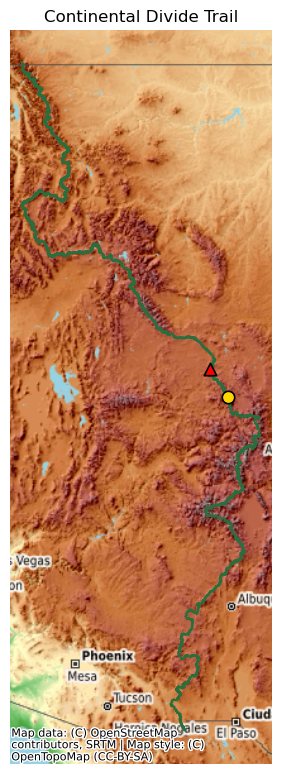

Continental Divide Trail, distance between: 55.8 mi


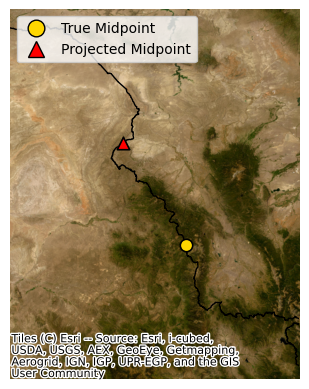

In [22]:
import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 8))

name, trail, midpoint, projected, mean_err = trail_stats[1]

trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="#2b6e3d", linewidth=2, linestyle="-")
ax.scatter(
    midpoint_3857.x,
    midpoint_3857.y,
    s=80,
    marker="o",
    facecolor="gold",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)
ax.scatter(
    projected_3857.x,
    projected_3857.y,
    s=80,
    marker="^",
    facecolor="red",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)

# ax.set_xlim((-1.35e7, -0.95e7))
ctx.add_basemap(ax, source=ctx.providers.OpenTopoMap, zoom=5)
ax.set_axis_off()
plt.title(name)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(4, 4))

name, trail, midpoint, projected, mean_err = trail_stats[1]
trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="k", linewidth=1, linestyle="-")
ax.scatter(
    midpoint_3857.x,
    midpoint_3857.y,
    s=80,
    marker="o",
    facecolor="gold",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)
ax.scatter(
    projected_3857.x,
    projected_3857.y,
    s=80,
    marker="^",
    facecolor="red",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)

center = np.mean((midpoint_3857.x, projected_3857.x)), np.mean(
    (midpoint_3857.y, projected_3857.y)
)

legend_elements = [
    Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label="True Midpoint",
        markerfacecolor="gold",
        markeredgecolor="k",
        markersize=12,
        linewidth=0,
    ),
    Line2D(
        [0],
        [0],
        marker="^",
        color="w",
        label="Projected Midpoint",
        markerfacecolor="red",
        markeredgecolor="k",
        markersize=12,
        linewidth=0,
    ),
]

xlim, ylim = get_bounds(midpoint_3857, projected_3857, 1.8, 1.3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, zoom=10)
ax.legend(handles=legend_elements, loc="upper left", frameon=True)
# ax.set_title(f"{name}, distance between: {mean_err:.1f} mi")
print(f"{name}, distance between: {mean_err:.1f} mi")
ax.set_axis_off()
plt.tight_layout()
plt.show()

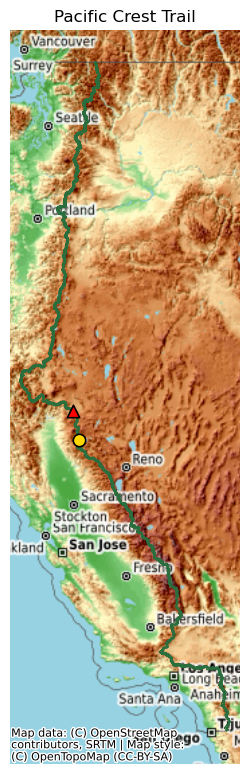

Pacific Crest Trail, distance between: 41.0 mi


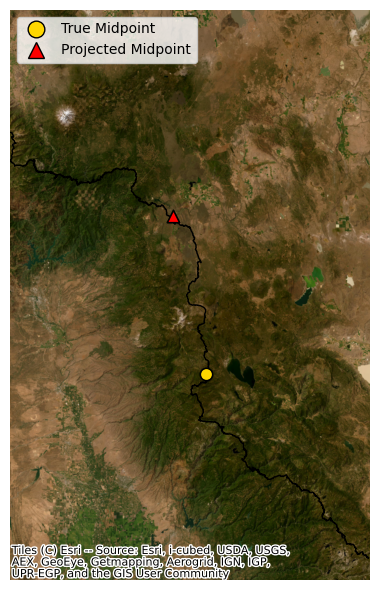

In [21]:
import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 8))

name, trail, midpoint, projected, mean_err = trail_stats[0]

trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="#2b6e3d", linewidth=2, linestyle="-")
ax.scatter(
    midpoint_3857.x,
    midpoint_3857.y,
    s=80,
    marker="o",
    facecolor="gold",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)
ax.scatter(
    projected_3857.x,
    projected_3857.y,
    s=80,
    marker="^",
    facecolor="red",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)

# ax.set_xlim((-1.35e7, -0.95e7))
ctx.add_basemap(ax, source=ctx.providers.OpenTopoMap, zoom=5)
ax.set_axis_off()
plt.title(name)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(6, 6))

name, trail, midpoint, projected, mean_err = trail_stats[0]
trail_3857 = trail.to_crs(epsg=3857)
midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

trail_3857.plot(ax=ax, color="k", linewidth=1, linestyle="-")
ax.scatter(
    midpoint_3857.x,
    midpoint_3857.y,
    s=80,
    marker="o",
    facecolor="gold",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)
ax.scatter(
    projected_3857.x,
    projected_3857.y,
    s=80,
    marker="^",
    facecolor="red",
    edgecolor="black",
    linewidth=1.2,
    zorder=10,
)

center = np.mean((midpoint_3857.x, projected_3857.x)), np.mean(
    (midpoint_3857.y, projected_3857.y)
)

legend_elements = [
    Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label="True Midpoint",
        markerfacecolor="gold",
        markeredgecolor="k",
        markersize=12,
        linewidth=0,
    ),
    Line2D(
        [0],
        [0],
        marker="^",
        color="w",
        label="Projected Midpoint",
        markerfacecolor="red",
        markeredgecolor="k",
        markersize=12,
        linewidth=0,
    ),
]

xlim, ylim = get_bounds(midpoint_3857, projected_3857, 5, 1.3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, zoom=10)
ax.legend(handles=legend_elements, loc="upper left", frameon=True)
# ax.set_title(f"{name}, distance between: {mean_err:.1f} mi")
print(f"{name}, distance between: {mean_err:.1f} mi")
ax.set_axis_off()
plt.tight_layout()
plt.show()

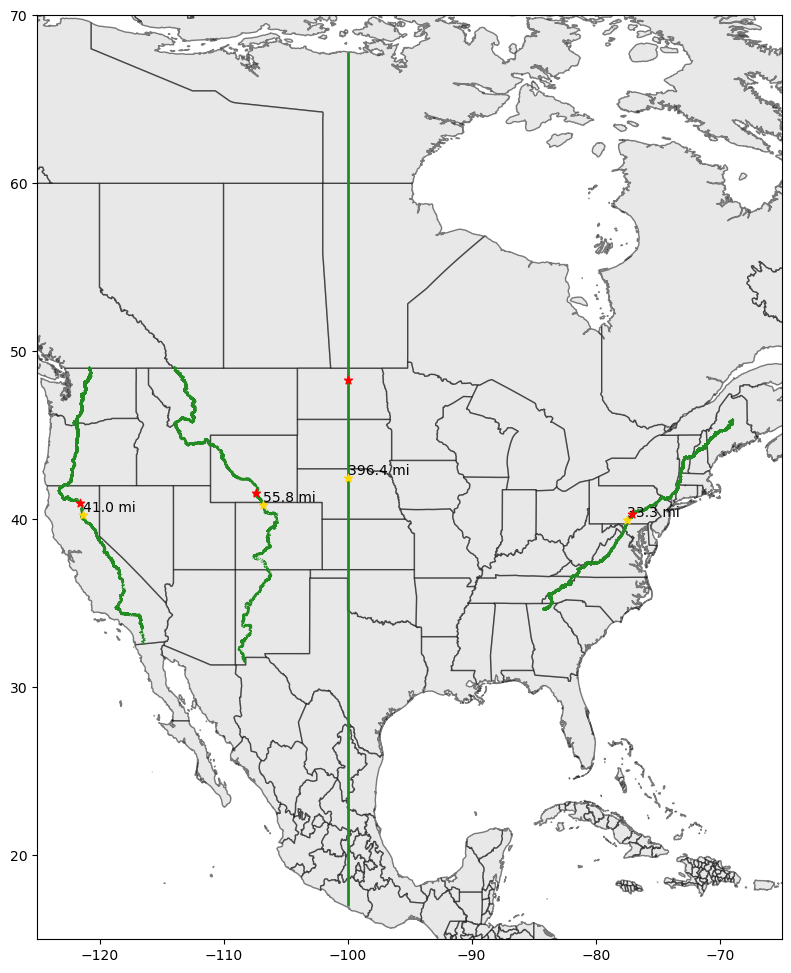

In [21]:
fig, ax = plt.subplots(figsize=(12, 12))
borders.plot(
    ax=ax,
    facecolor="lightgray",
    edgecolor="black",
    alpha=0.5,
)

for name, trail, midpoint, projected, mean_err in trail_stats:
    trail.plot(ax=ax, color="forestgreen", linewidth=2)
    ax.scatter(midpoint.x, midpoint.y, color="gold", marker="*", label="True Midpoint", zorder=10)
    ax.scatter(projected.x, projected.y, color="red", marker="*", label="Apparent Midpoint", zorder=10)
    ax.text(midpoint.x, midpoint.y, f"{mean_err:.1f} mi", fontsize=10, ha="left", va="bottom")

ax.set_xlim((-125, -65))
ax.set_ylim((15, 70))
#ax.axis("off")
plt.show()

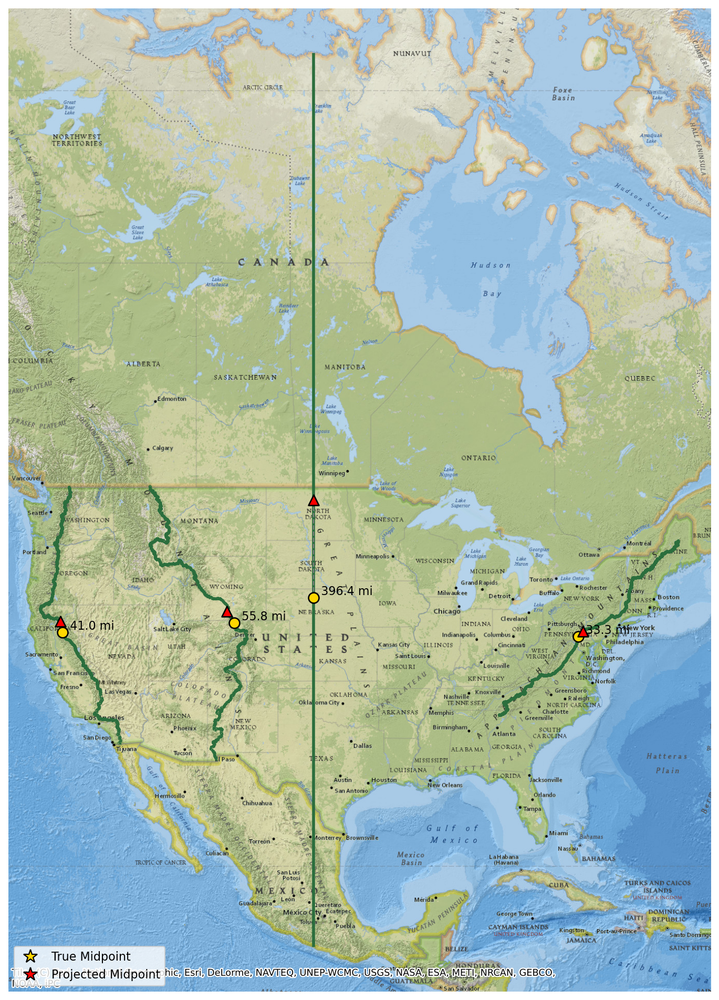

In [22]:
import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 12), dpi=160)

for name, trail, midpoint, projected, mean_err in trail_stats:
    trail_3857 = trail.to_crs(epsg=3857)
    midpoint_3857 = gpd.GeoSeries([midpoint], crs=4326).to_crs(epsg=3857).iloc[0]
    projected_3857 = gpd.GeoSeries([projected], crs=4326).to_crs(epsg=3857).iloc[0]

    trail_3857.plot(ax=ax, color="#2b6e3d", linewidth=2.5, linestyle="-")
    ax.scatter(midpoint_3857.x, midpoint_3857.y, 
           s=80, marker='o', facecolor='gold', edgecolor='black', linewidth=1.2, zorder=10)
    ax.scatter(projected_3857.x, projected_3857.y,
           s=80, marker='^', facecolor='red', edgecolor='black', linewidth=1.2, zorder=10)
    ax.text(midpoint_3857.x, midpoint_3857.y, f"  {mean_err:.1f} mi", fontsize=10, ha="left", va="bottom")
    
    ax.plot([midpoint_3857.x, projected_3857.x],
        [midpoint_3857.y, projected_3857.y],
        color='gray', linestyle='--', linewidth=1,)
    
ctx.add_basemap(ax, source=ctx.providers.Esri.NatGeoWorldMap, zoom=5)
ax.set_axis_off()
# ax.scatter([], [], s=150, color="gold", edgecolor='k', linewidth=1, marker="*", label="True Halfway")
# ax.scatter([], [], s=150, color="red", edgecolor='k', linewidth=1, marker="*", label="Visual Halfway")
# ax.legend(loc="upper right", frameon=True)
from matplotlib.lines import Line2D
# Add dummy artists outside the loop
legend_elements = [
    Line2D([0], [0], marker='*', color='w', label='True Midpoint',
           markerfacecolor='gold', markeredgecolor='k', markersize=12, linewidth=0),
    Line2D([0], [0], marker='*', color='w', label='Projected Midpoint',
           markerfacecolor='red', markeredgecolor='k', markersize=12, linewidth=0)
]
ax.legend(handles=legend_elements, loc='lower left', frameon=True)
plt.tight_layout()
plt.show()

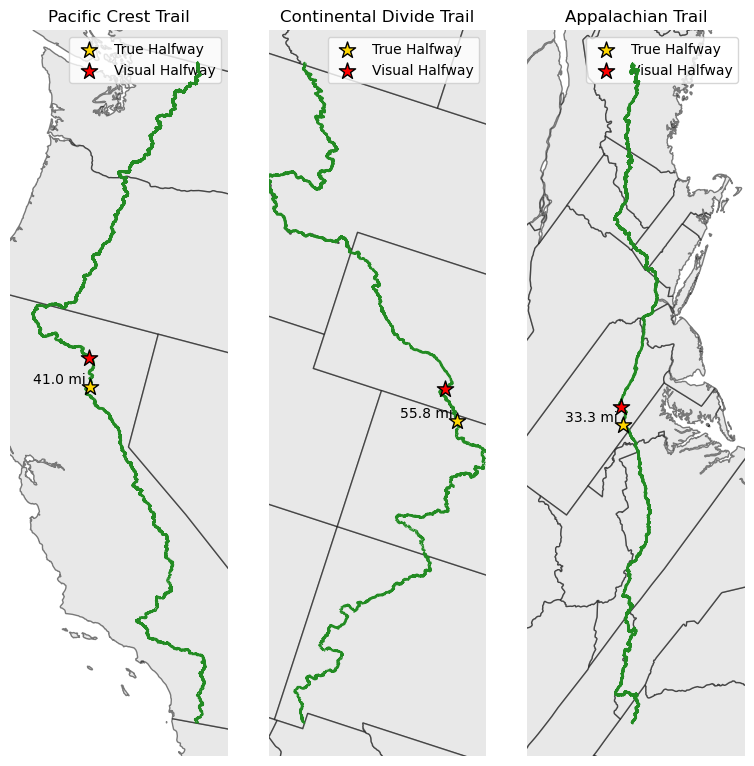

In [267]:
fig, axes = plt.subplots(1,3,figsize=(8, 8))
# Plot base layer normally (like borders if you have them)
# borders.plot(ax=ax, ...)

for ax, (name, trail, midpoint, projected, mean_err) in zip(axes, trail_stats):
    # Create a transform that rotates around the trail's centroid
    azimuth_deg = mean_azimuth(trail)+90
    centroid = at.union_all().centroid
    transform = (transforms.Affine2D().rotate_deg_around(centroid.x, centroid.y, -azimuth_deg) + ax.transData)

    # Plot the trail with the transform
    trail.plot(ax=ax, color="forestgreen", linewidth=2, transform=transform, zorder = 10)

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    ax.scatter(midpoint.x, midpoint.y, s=150, color="gold", edgecolor='k',linewidth=1,marker="*", zorder=10,transform=transform, )
    ax.scatter(projected.x, projected.y, s=150, color="red",edgecolor='k', linewidth=1,marker="*", zorder=10,transform=transform, )
    ax.text(midpoint.x, midpoint.y, f"{mean_err:.1f} mi ", fontsize=10, ha="right", va="bottom", transform=transform)
    northam.plot(ax=ax, facecolor="lightgray", edgecolor="black", alpha=0.5, transform=transform)

    # add buffer
    ylim = np.array(ylim) * 1
    xlim = 0.15 * np.diff(ylim) * [-1, 1] + np.mean(xlim)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.scatter([], [], s=150, color="gold", edgecolor='k', linewidth=1, marker="*", label="True Halfway")
    ax.scatter([], [], s=150, color="red", edgecolor='k', linewidth=1, marker="*", label="Visual Halfway")
    ax.legend(frameon=True)
    plt.tight_layout()
    ax.axis("off")
    ax.set_aspect("equal")
    ax.set_title(name)
plt.show()